## __Final Project__

_Evironmental Statitistics and Models_

In [169]:
import numpy as np

# Reading & Transformation
import pandas as pd
import geopandas as gpd

# Curve Fit
from scipy.optimize import curve_fit

# Plotting
import pydeck as pdk
import matplotlib.pyplot as plt


# # Spatitial Stats
# import pointpats


In [170]:
import seaborn as sns
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# Set Seaborn color palette
cmap = 'Set2'
sns.set_palette(cmap)

# Update Matplotlib rcParams
mpl.rcParams.update({
    'font.family': 'Consolas',  # Font family for all text
    'figure.dpi': 200,  # High resolution for figures
    
    # Axes settings
    'axes.titlesize': 12,  # Font size for the axes title
    'axes.titleweight': 'normal',  # Weight for the axes title
    'axes.labelsize': 10,  # Font size for the axes labels
    
    # Tick settings
    'xtick.direction': 'in',  # Ticks pointing inwards
    'ytick.direction': 'in',  # Ticks pointing inwards
    'xtick.minor.visible': True,  # Show minor ticks on x-axis
    'ytick.minor.visible': True,  # Show minor ticks on y-axis

    # Grid settings
    'axes.grid': True,  # Enable grid by default
    'axes.grid.which': 'both',  # Show both major and minor grids
    'grid.linestyle': ':',  # Dotted grid lines
    'grid.alpha': 0.3,  # Transparency for major grid lines
    'grid.linewidth': 0.6,  # Line width for major grid lines

})


plt.rcParams['ytick.right'] = plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

__Load Data and prepare__


In [171]:
# Read table Data
fp_table = r"data/NationalSurveyData.csv"
d = pd.read_csv(fp_table,sep=",",skipinitialspace=True,skiprows=(0,1,2,3,5,6),)

# Read Borders
shp = gpd.read_file(r"data/borders.shp")


In [172]:
# Achtung Vereinfachung
d["As"] = d['As'].str.replace(r"^<", "", regex=True).astype(float)


In [173]:
# Create a GeoDataFrame from the DataFrame and lat/lon lists
dg = gpd.GeoDataFrame(d, geometry=gpd.points_from_xy(d["LONG_DEG"], d["LAT_DEG"]))

# Set the coordinate reference system to WGS84 (EPSG:4326)
dg.set_crs(epsg=4326, inplace=True)

# Display the GeoDataFrame
dg.head()

,SAMPLE_ID,SAMPLE_FIELD_ID,SAMPLE_DATE,LAT_DEG,LONG_DEG,YEAR_CONSTRUCTION,WELL_TYPE,WELL_DEPTH,DIVISION,DISTRICT,...,Mg,Mn,Na,P_,Si,SO4,Sr,V_,Zn,geometry
0,S98_00718,"RIP3492, BTS118",08/03/1998,23.0194,90.8786,1971.0,Shallow HP TW,12.2,Chittagong,Lakshmipur,...,29.9,0.447,7.9,1.2,13.9,< 0.2,0.246,< 0.006,0.031,POINT (90.87860 23.01940)
1,S98_00724,"RIP3493, BTS124",10/03/1998,22.9650,90.9597,1995.0,Private HP TW,12.2,Chittagong,Lakshmipur,...,15.7,0.231,205.0,0.6,13.8,1.5,0.108,< 0.006,0.021,POINT (90.95970 22.96500)
2,S98_00727,"RIP3498, BTS127",10/03/1998,22.9253,90.9744,1997.0,Private HP TW,262.1,Chittagong,Lakshmipur,...,75.8,0.294,201.0,0.3,27.2,4.9,0.873,< 0.006,0.067,POINT (90.97440 22.92530)
3,S98_00733,"RIP3494, BTS133",11/03/1998,22.8653,90.9372,1993.0,Private HP TW,7.9,Chittagong,Lakshmipur,...,124,1.17,1090.0,0.5,10.3,265,0.797,0.009,0.054,POINT (90.93720 22.86530)
4,S98_00734,"RIP3499, BTS134",11/03/1998,22.8525,90.9058,1990.0,Village HP TW,182.9,Chittagong,Lakshmipur,...,16.9,0.051,43.8,0.2,21.4,< 0.2,0.216,< 0.006,< 0.008,POINT (90.90580 22.85250)


In [174]:
dg.columns

Index(['SAMPLE_ID', 'SAMPLE_FIELD_ID', 'SAMPLE_DATE', 'LAT_DEG', 'LONG_DEG',
       'YEAR_CONSTRUCTION', 'WELL_TYPE', 'WELL_DEPTH', 'DIVISION', 'DISTRICT',
       'THANA', 'UNION', 'MOUZA', 'GEOCODE', 'As', 'Al', 'B_', 'Ba', 'Ca',
       'Co', 'Cr', 'Cu', 'Fe', 'K_', 'Li', 'Mg', 'Mn', 'Na', 'P_', 'Si', 'SO4',
       'Sr', 'V_', 'Zn', 'geometry'],
      dtype='object')

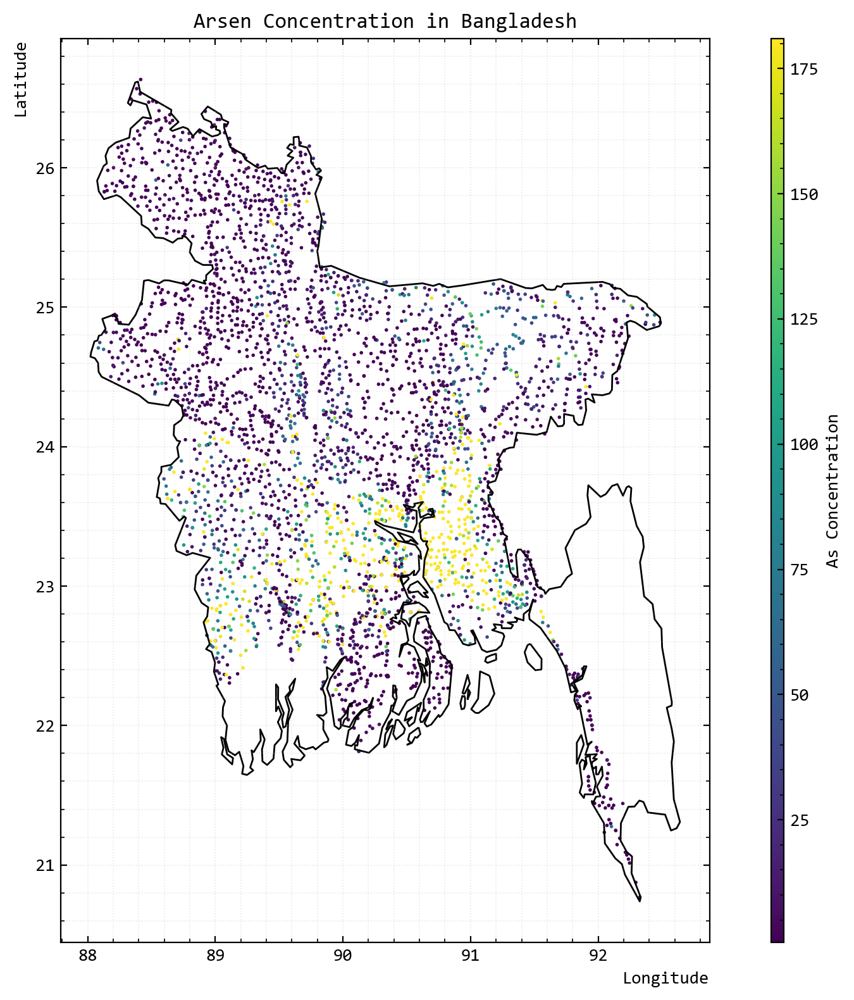

In [175]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_plot = dg.plot(column='As', cmap='viridis', vmax=np.nanpercentile(dg["As"], 90), vmin=np.nanpercentile(dg["As"], 5), markersize=1, ax=ax)
plt.title('Arsen Concentration in Bangladesh')
shp.plot(ax=gdf_plot, edgecolor='black', facecolor='none')
fig.colorbar(gdf_plot.collections[0], ax=gdf_plot,orientation="vertical",shrink=1,aspect=70,label="As Concentration")
ax.set_xlabel('Longitude',loc="right")
ax.set_ylabel('Latitude',loc="top")
plt.tight_layout()
# ax.set_xticklabels([f'{tick}°' for tick in ax.get_xticks()])
# ax.set_yticklabels([f'{tick}°' for tick in ax.get_yticks()])
plt.show()

In [176]:
gj = shp.to_json()

# Create a Pydeck GeoJsonLayer
poly= pdk.Layer(
        "GeoJsonLayer",
        data=shp,
        get_fill_color=[100,100,100,0],
        get_line_color=[120,120,120,255],  # Border color
        line_width_min_pixels=1.5
    )

# Define a layer to display the points
layer = pdk.Layer(
    'ScatterplotLayer',
    data=dg,
    get_position='[LONG_DEG, LAT_DEG]',
    get_fill_color='[0 + As * 2, 30 + As * 10, 180-As*2, 255]',
    get_radius=1400,
    pickable=True
)

# Set the viewport location
view_state = pdk.ViewState(
    latitude=dg['LAT_DEG'].mean(),
    longitude=dg['LONG_DEG'].mean(),
    zoom=7,
    pitch=0
)

# Render the deck.gl map with a light theme
r = pdk.Deck(
    layers=[poly,layer],
    initial_view_state=view_state,
    map_provider=None,
    height=500,
    tooltip={"text": "{As}"},
    map_style="light_no_labels" 
)
r.to_html('ScatterplotLayer.html',iframe_height=800)

### __Variogramm__

In [177]:
# Ellipsoidal Coordinates to Metric CRS
main_crs = "EPSG:9678" # https://epsg.io/9678
dg = dg.to_crs(main_crs)
shp = shp.to_crs(main_crs)


In [178]:
east = dg.geometry.x
north = dg.geometry.y

# Position Vector of Observations
x_o = dg.get_coordinates().values # [East , North] # m

n_points = len(east)

print(f"n points: {n_points} observations")

n points: 3533 observations


In [179]:
x_o

array([[590312.7263189 , 545642.88163363],
       [598662.87479528, 539672.42032658],
       [600199.02084721, 535287.1883776 ],
       ...,
       [356226.90211623, 776918.34204167],
       [359580.79670502, 768653.67506328],
       [357615.66387445, 770844.99576436]])

In [180]:
east

0       590312.726319
1       598662.874795
2       600199.020847
3       596426.546436
4       593213.879346
            ...      
3528    378965.891758
3529    376383.673174
3530    356226.902116
3531    359580.796705
3532    357615.663874
Length: 3533, dtype: float64

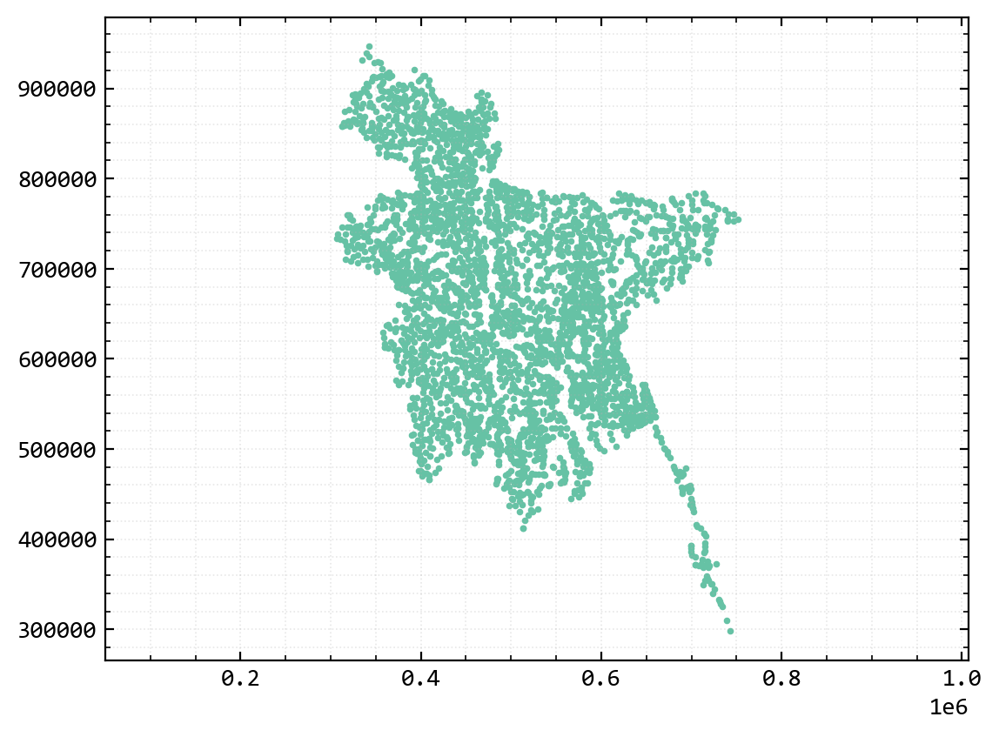

In [181]:
plt.scatter(east,north,s=3)
plt.axis("equal")
plt.show()

In [182]:
## Point to Point Distances, for all points

dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1)

# Distanzan sind in beide Richtungen deswegen hälftze löschen
dists_half = np.triu(dists) # Diagonale auch null das nicht abstand mit sich selber berücksichtigt wird

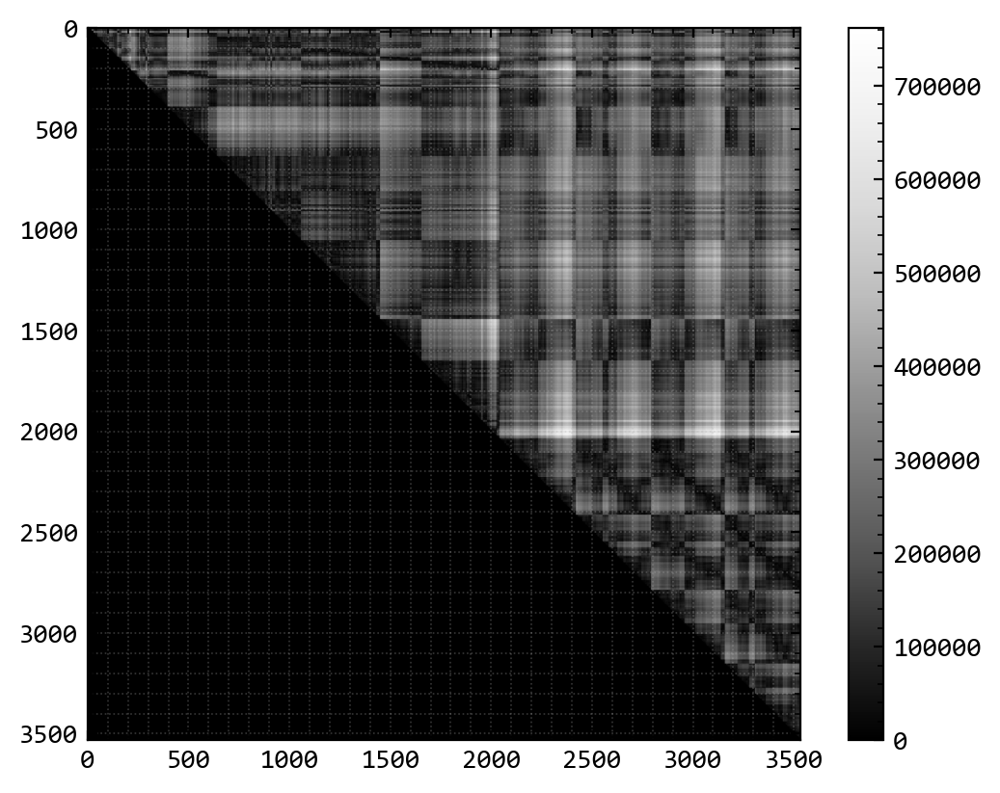

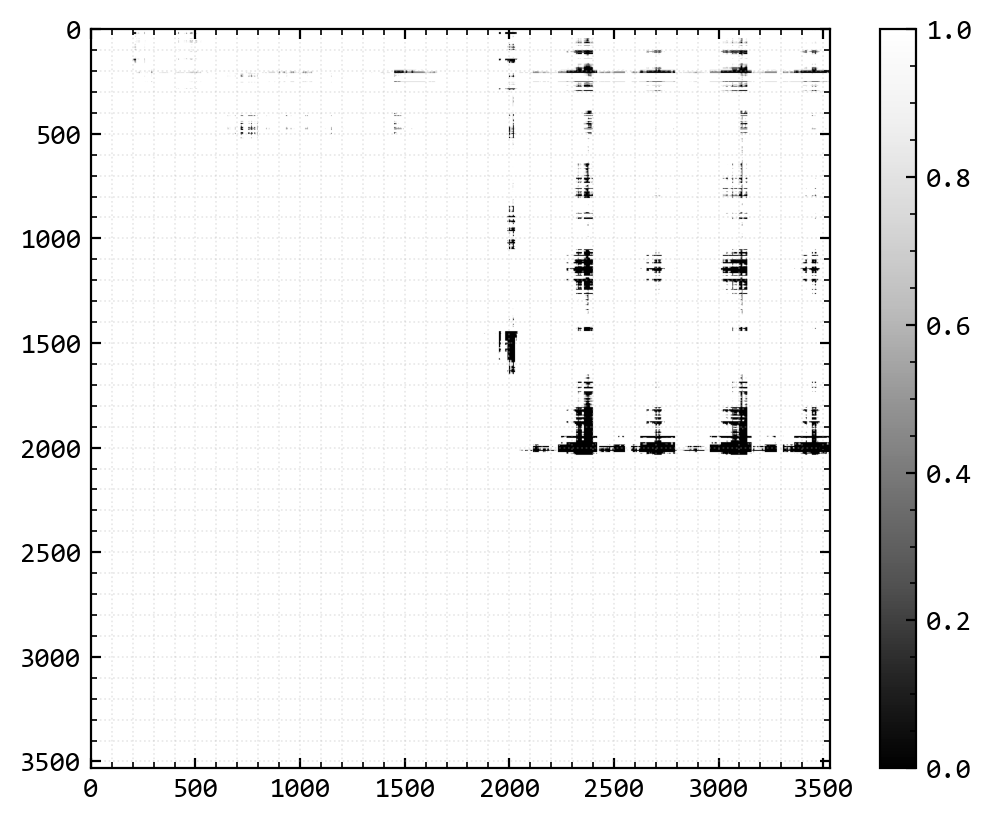

In [183]:
im = plt.imshow(dists_half,origin="upper",cmap="Greys_r")
plt.colorbar(im)
plt.show()


re = dists_half < 400000

im = plt.imshow(re,origin="upper",cmap="Greys_r")
plt.colorbar(im)
plt.show()


In [184]:
## Histogram for Distances
n_bins = 60

select_max_dist = 90 # %


# Histogramm
hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,select_max_dist)))

# Mean Lag h in each class
bin_centers = (bin_edges[1:]+bin_edges[:-1])/2


## Z Values
z = d["As"].values
z_diff = z[:,np.newaxis] - z[np.newaxis,:]
z_diff_half = np.triu(z_diff) # Clean that not double distance for every pair


print("-------------")
print("Max used distance:",np.percentile(dists,80)/1000,"km ("+str(select_max_dist)+" %)")
print("-------------")


-------------
Max used distance: 277.09628404895585 km (90 %)
-------------


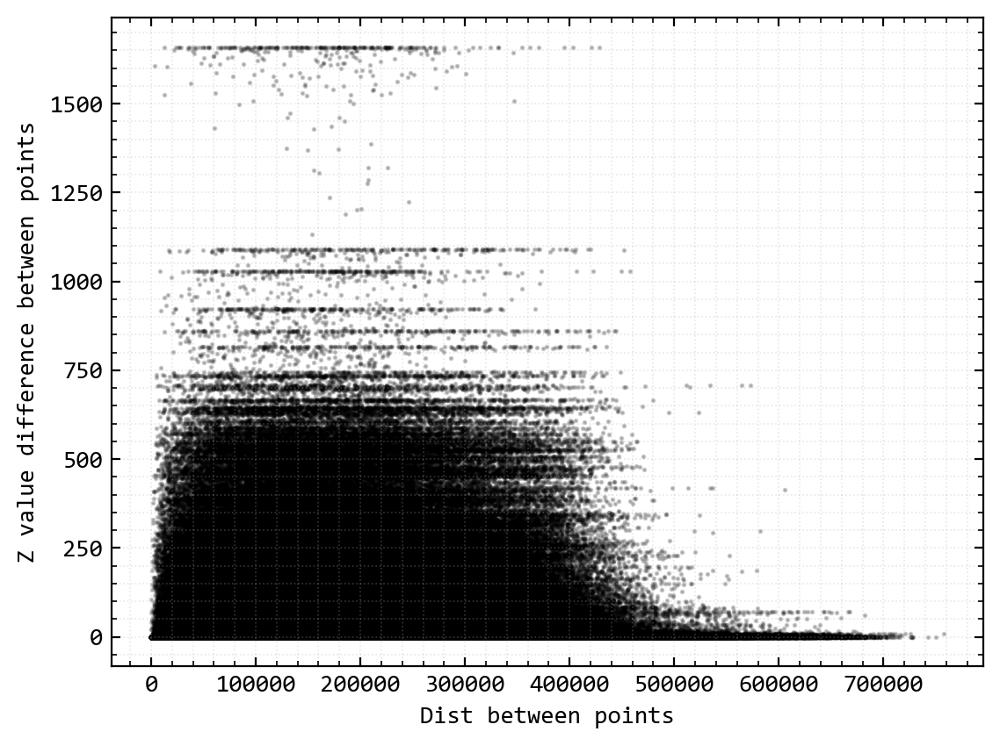

In [185]:
plt.scatter(dists.flatten()[::10],np.abs(z_diff_half.flatten()[::10]),s=1,c="k",alpha=0.2)
plt.xlabel("Dist between points")
plt.ylabel("Z value difference between points")

plt.show()

The Semivarinace is defined as followed:

$$
γ(h)=\frac{1}{2N(h)} \sum_{i=1}^{N}(Z(x_i+h)−Z(x_i))^2
$$

- where $h$ is the distance between points in the lag class
- $N(h)$ is the number of points with the distance h (Number of points per lag class).
- $x_i$ is the position of the i-th point and $Z$ is the attribute value at the position $x_i$

_(Benndorf, 2023)_

Benndorf, Jörg. Angewandte Geodatenanalyse und -Modellierung. 2023. Springer Vieweg Wiesbaden. 978-3-658-39981-8. https://doi.org/10.1007/978-3-658-39981-8

In [186]:
## Semivariance
semi_var = np.zeros(len(hist)) * np.nan

# Iterate over all lag classes
for i in range(len(hist)):
    
    # Selecting all Z values in the actual Lag Class (h or dist-class)
    diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

    # plt.figure()
    # im = plt.imshow((dists >= bin_edges[i]) & (dists < bin_edges[i+1]),origin="lower",cmap="Greys_r")
    # plt.colorbar(im)
    # plt.show()

    # Count Distances in class
    n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
    
    # print(n)
    # print(np.sum( diff**2 ))
    # print(1 / (n*2) * np.sum( diff**2 ))
    # print("---")

    # Semivariance for Class i
    semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

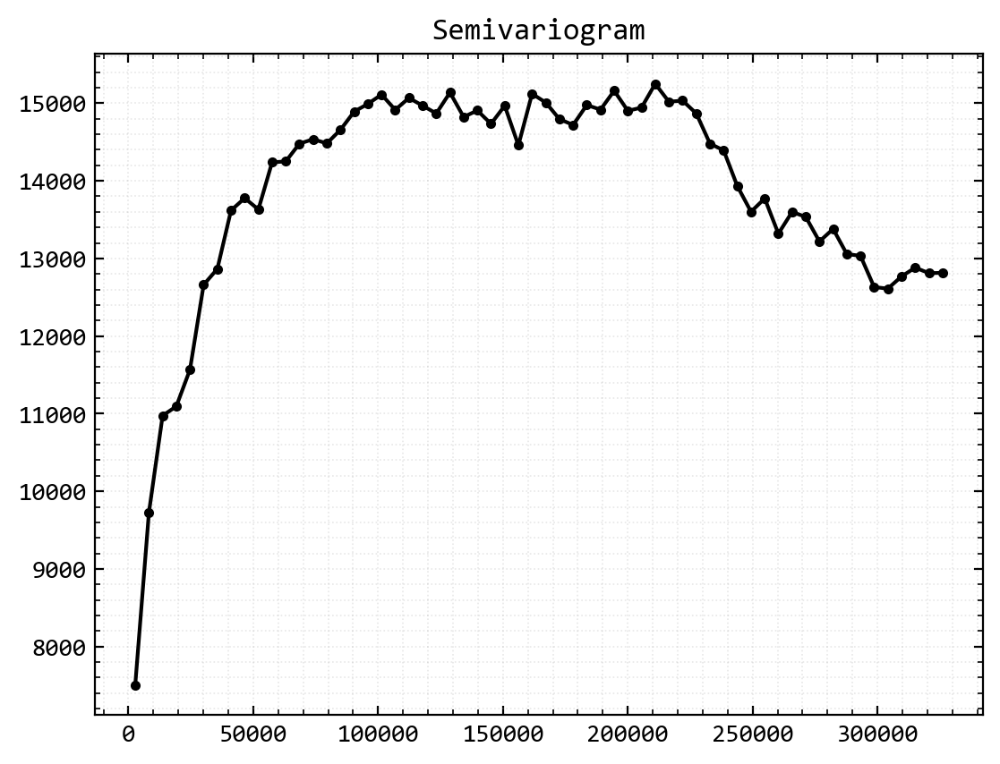

In [187]:
plt.plot(bin_centers,semi_var,marker='o',ms=3,c="k")
plt.title("Semivariogram")
plt.show()

### __Theoretical Variogramm Model Fitting__

In [188]:
# https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html


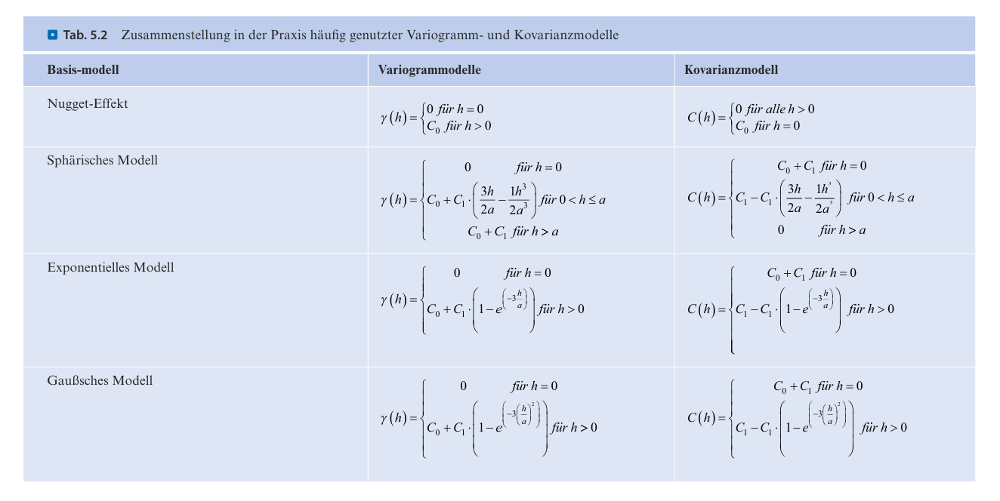

The formula for the spherical variogram model is given by:

$$
\gamma(h) = 
\begin{cases} 
C_0 + C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
C_0 + C & \text{if } h > a 
\end{cases}
$$

where:
- $h$ is the lag distance,
- $C_0$ is the nugget,
- $C$ is the sill minus the nugget,
- $a$ is the range.

Modified formula to include $C_0$ fo $h=0$

In [189]:
def spherical(h, c0, c, a):
    semivar = np.zeros_like(h)
    mask1 = (h >=0 ) & (h <= a)
    mask2 = h > a
    semivar[mask1] = c0 + c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    semivar[mask2] = c0 + c
    return semivar


def spherical_cov(h, c0, c, a):
    covariance = np.zeros_like(h)
    mask1 = (h > 0 ) & (h <= a)
    mask2 = h == 0
    covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    covariance[mask2] = c0 + c # Nugget effect
    # covariance for h > a is already Zero due to covariance initalization
    return covariance


x = bin_centers[1:] # Drop first element to remove peak/disturbance
y = semi_var[1:]
# TODO automate the p0 value selction from expireminetal variogram
# TODO hinzufügen von bounds wie in https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html
cof_u, cov = curve_fit(spherical, x, y,p0 = [10000,15000,100000] )

print(f"Nugget (C_0): {cof_u[0]:.2f}")
print(f"Sill (C_1): {cof_u[1]:.2f}")
print(f"Range (a): {cof_u[2]:.2f}")
print(f"max Var: {cof_u[0]+cof_u[1]:.2f}")

Nugget (C_0): 8894.27
Sill (C_1): 5405.99
Range (a): 64454.99
max Var: 14300.26


In [190]:
np.var(z)

14017.793352598273

In [191]:
"""def cov(h,c0,c,a):
    return c0 + c - spherical(h,c0,c,a)
    """

'def cov(h,c0,c,a):\n    return c0 + c - spherical(h,c0,c,a)\n    '

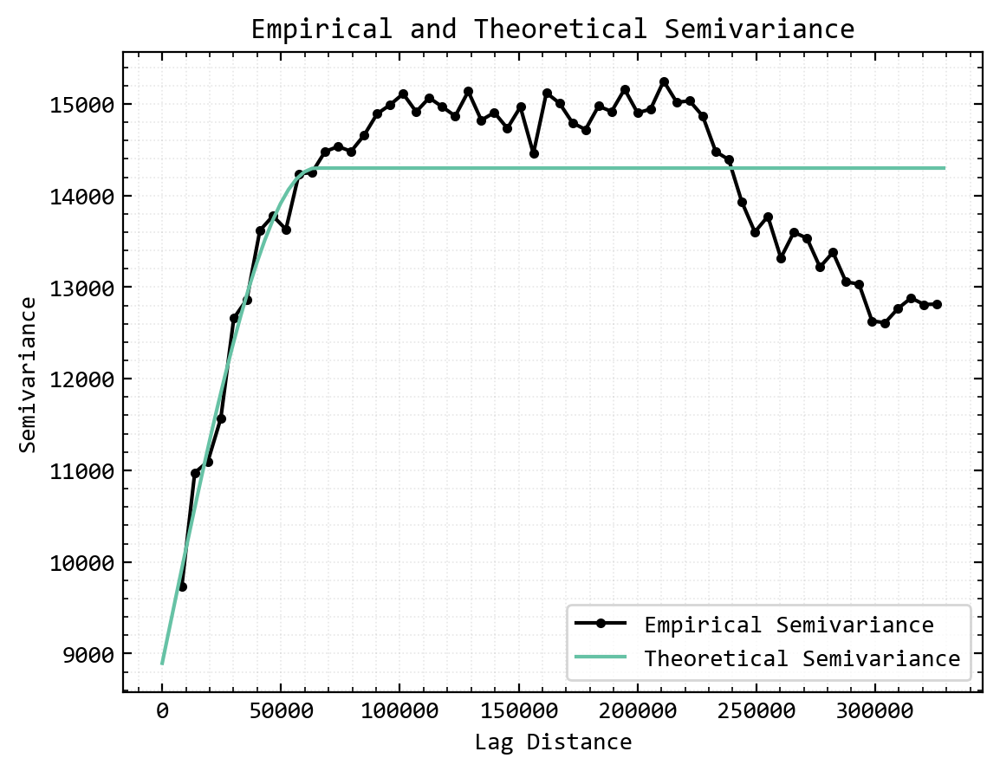

In [192]:
# Plot Spherical Model
h_theo = np.linspace(0,bin_edges.max(),100)
semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

plt.plot(bin_centers[1:], semi_var[1:], marker='o', ms=3, c="k", label='Empirical Semivariance')
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.xlabel('Lag Distance')
plt.ylabel('Semivariance')
plt.title('Empirical and Theoretical Semivariance')
plt.legend()
plt.show()


__Covariance and Interpolations weights__

The Covariance is derived from the Semmivariance:

$$
Cov(h) = 
\begin{cases} 
C - C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
0 & \text{if } h > a 
\end{cases}
$$

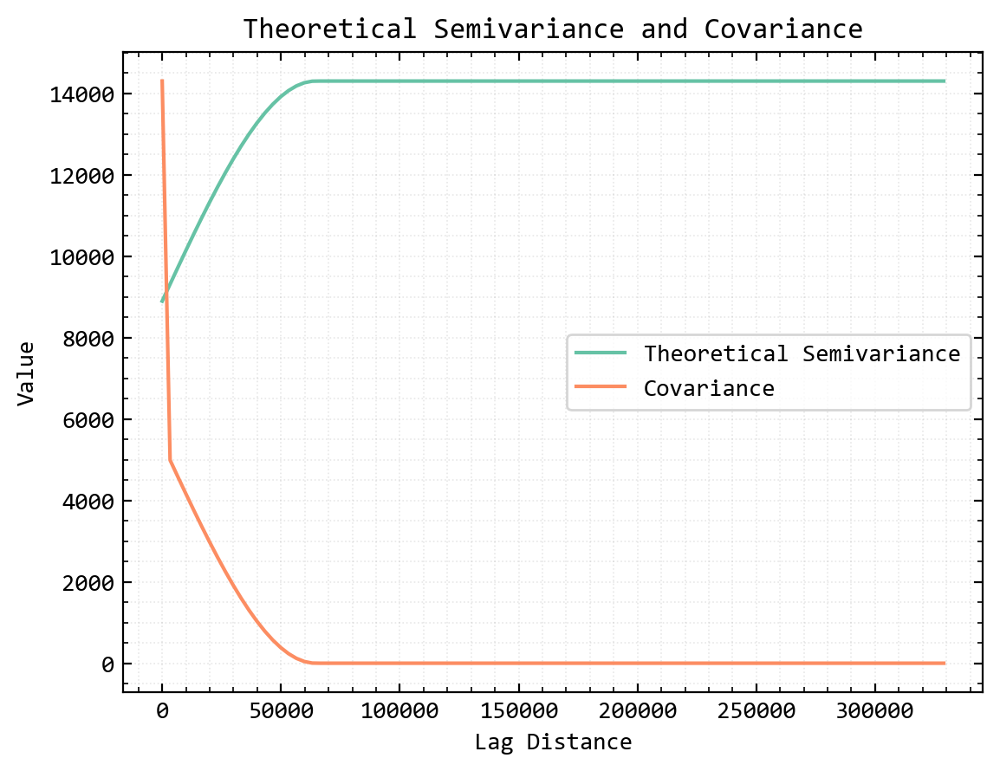

In [193]:
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.plot(h_theo, cov, label='Covariance')
plt.xlabel('Lag Distance')
plt.ylabel('Value')
plt.title('Theoretical Semivariance and Covariance')
plt.legend()
plt.show()

### __Kriging__

In [223]:
# Erstmal simple Kriging
# Dann Indikator Kriging was gefragt ist

#### __1. Simple Kriging__

The Weigths for the Kriging are Calulated via the Covariance for each interpolation point:

$$
\lambda = \mathbf{C^{-1} \cdot c_0}
$$

the matrizes looks like that:



$$
\lambda =
\begin{bmatrix}
    \lambda_1 \\
    \lambda_2 \\
    \vdots \\
    \lambda_2
\end{bmatrix}, \quad
\mathbf{C} =
\begin{bmatrix}
    \text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \cdots & \text{Cov}[x_1, x_n] \\
    \text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \cdots & \text{Cov}[x_2, x_n] \\
    \vdots & \vdots & \ddots & \vdots \\
    \text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \cdots & \text{Cov}[x_n, x_n]
\end{bmatrix}, \quad
\mathbf{c}_0 =
\begin{bmatrix}
    \text{Cov}(x_1, x_0) \\
    \text{Cov}(x_2, x_0) \\
    \vdots \\
    \text{Cov}(x_n, x_0)
\end{bmatrix}
$$


__Simple Kriging__

$$
Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + \lambda_m \cdot m
$$

$$with$$

$$
\lambda_m = 1 - \sum_{i=0}^{n} \lambda_i.
$$


If we insert $\lambda_m$ and rewrite:

$$

Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + 1\cdot m - \sum_{i=0}^{n} \lambda_i \cdot m
$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot (z(x_i) -m) + m$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \lambda^{T} \cdot (\mathbf{Z} -m) + m$$


In [224]:
# Map range Bangladesh
n_range = (north.min(),north.max())
e_range = (east.min(),east.max())

# Interpolation Coords
res = 25_000
x_n, x_e = np.mgrid[n_range[0]:n_range[1]:res,e_range[0]:e_range[1]:res]

In [225]:
x_p = np.asarray([x_e.flatten(),x_n.flatten()]) # points of interpolation

x_p = x_p.T # Transverse to make it vertical
# x_p = np.rot90(x_p)

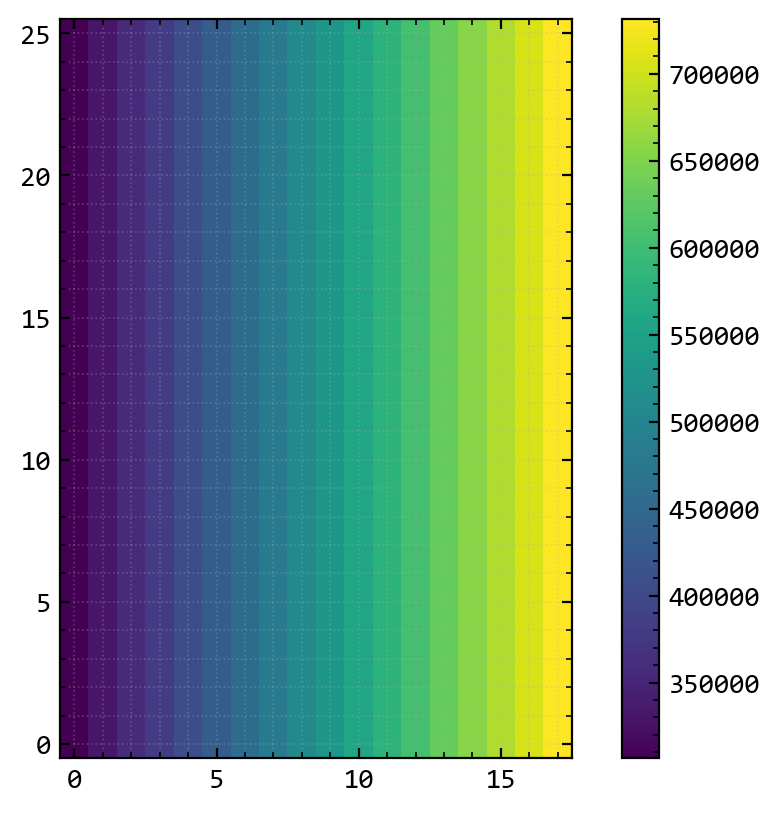

In [226]:
plt.imshow(x_p[:,0].reshape(x_n.shape),origin="lower")
plt.colorbar()
plt.show()

In [227]:
# Covariance for all Observation Points
C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2]) # TODO include local search area to cut computing costs

In [245]:
var = np.diag(C)
var

array([14300.25717757, 14300.25717757, 14300.25717757, ...,
       14300.25717757, 14300.25717757, 14300.25717757])

In [230]:

i = 122
dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1)
dists_p.shape

(3533,)

In [231]:
x_o[:] - x_p[i,:]

array([[ -66151.32408106,   97608.96023303],
       [ -57801.17560468,   91638.49892597],
       [ -56265.02955275,   87253.266977  ],
       ...,
       [-300237.14828373,  328884.42064106],
       [-296883.25369494,  320619.75366268],
       [-298848.38652551,  322811.07436376]])

In [232]:
dists_p.min()

32699.29124208662

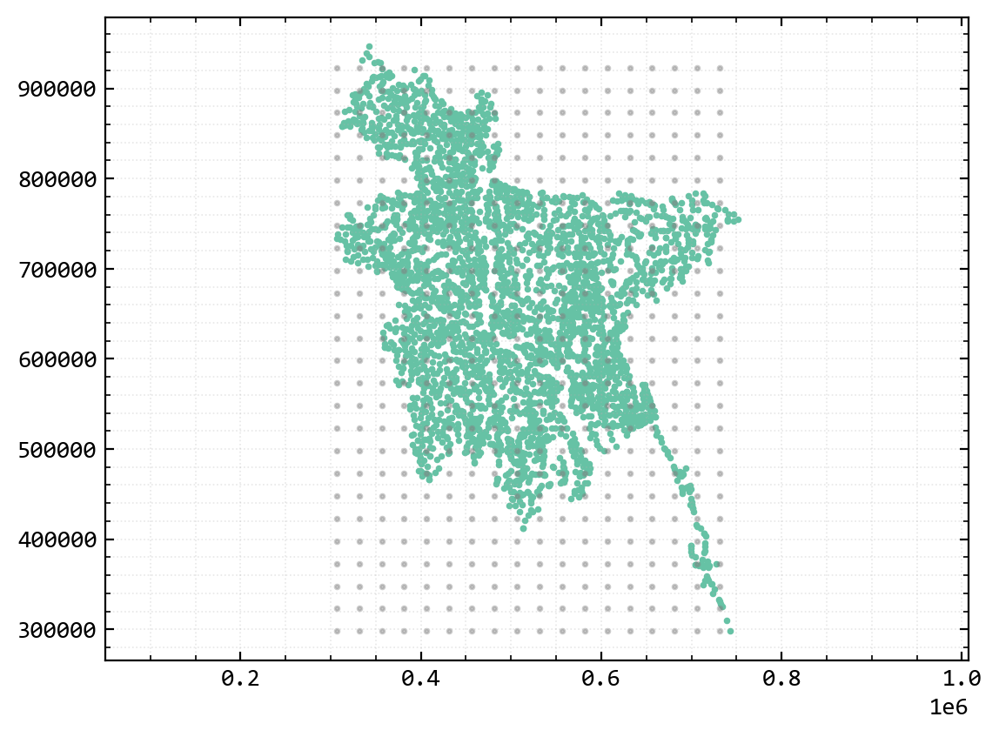

In [233]:
plt.scatter(x_o[:,0],x_o[:,1],s=3)
plt.scatter(x_p[:,0],x_p[:,1],s=3,c="grey",alpha=0.4)
plt.axis("equal")
plt.show()

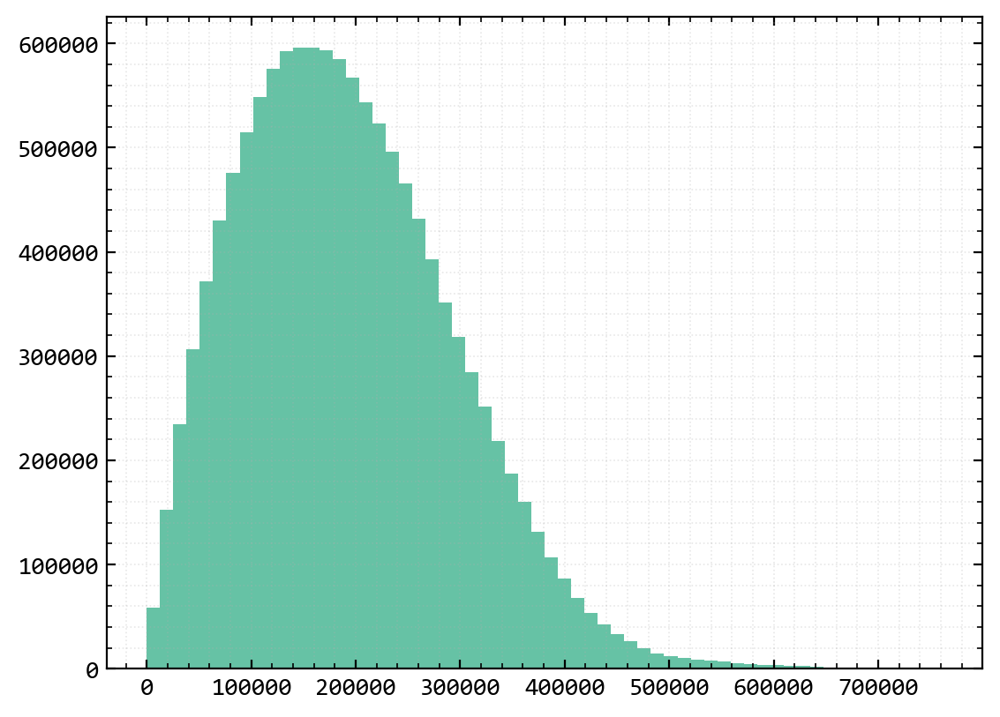

In [234]:
# All distances
plt.hist(dists.flatten(),60)
plt.show()

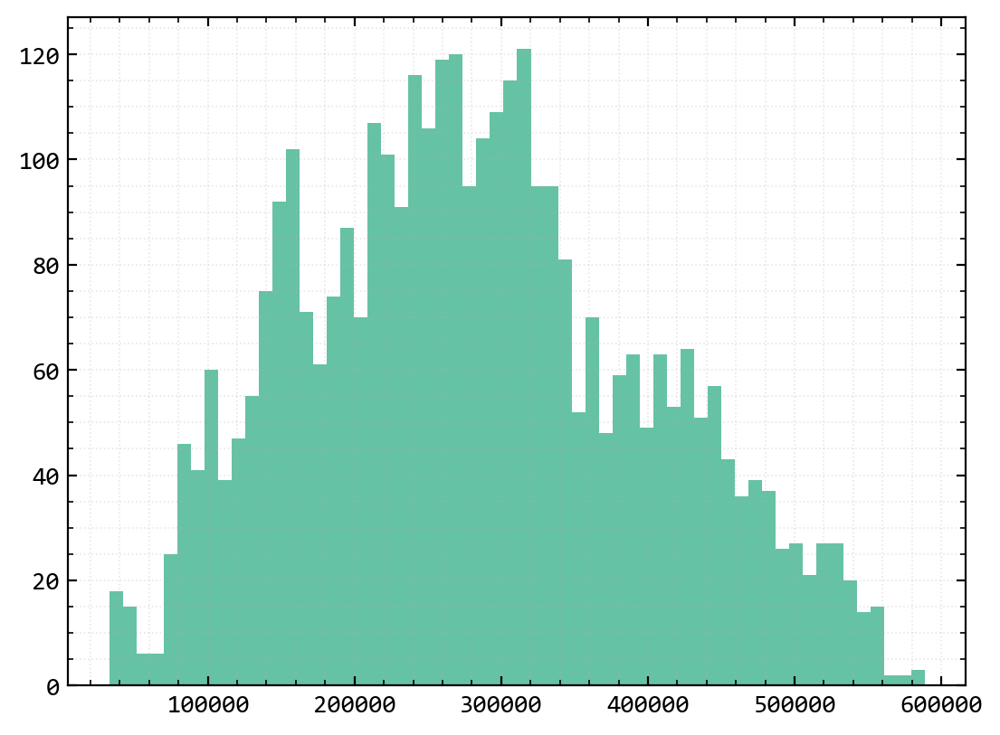

In [235]:
# Distances to one examination point
plt.hist(dists_p,60)
plt.show()

In [236]:
dists_p.min()

32699.29124208662

In [237]:
# np.linalg.matrix_rank(C)
# 3419
# shape = (3533, 3533)


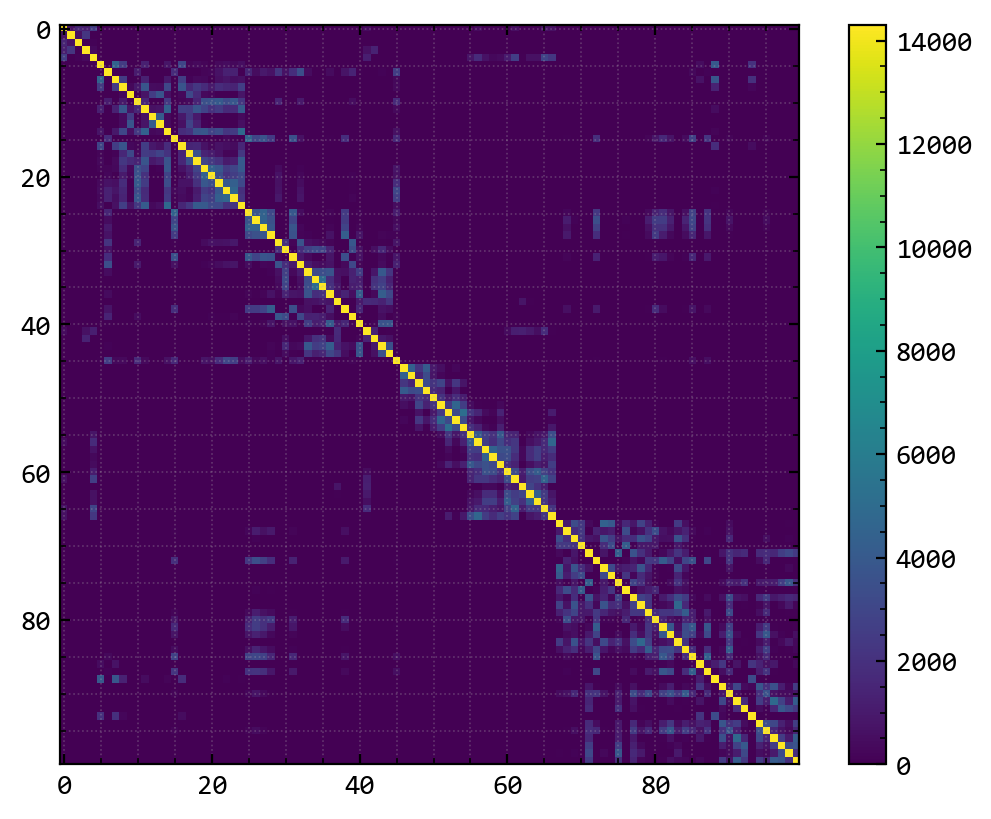

In [248]:
# Plot Covariance Matrix

plt.imshow(C[100:200,100:200])
plt.colorbar()
plt.show()

In [ ]:
# Calculating Inverse
C_iv = np.linalg.inv(C) ## TODO Problem mit der Inversen scheinbar?

# Mean to detrend Z
m = z.mean()

In [254]:
np.argmax(C_iv[100:200,100:200])

867

In [257]:
C.flatten()[867]

0.0

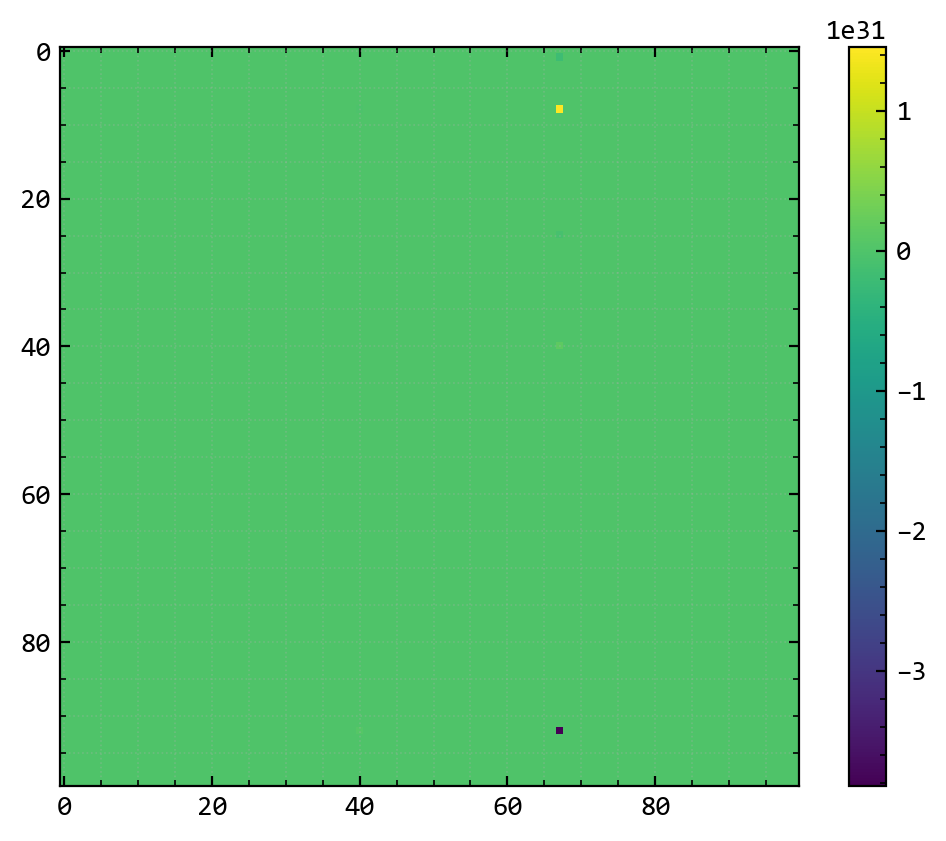

In [249]:
plt.imshow(C_iv[100:200,100:200])
plt.colorbar()
plt.show()

In [239]:
# Z_sk = np.empty(x_p.shape[0])
# for i in range(x_p.shape[0]):

#     dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
#     c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
#     lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)
#     lam_m = 1 - np.sum(lam)
#     print(i,lam.max(),lam_m)

#     Z_sk[i] = np.sum( lam * z + lam_m * m ) # interpolated value

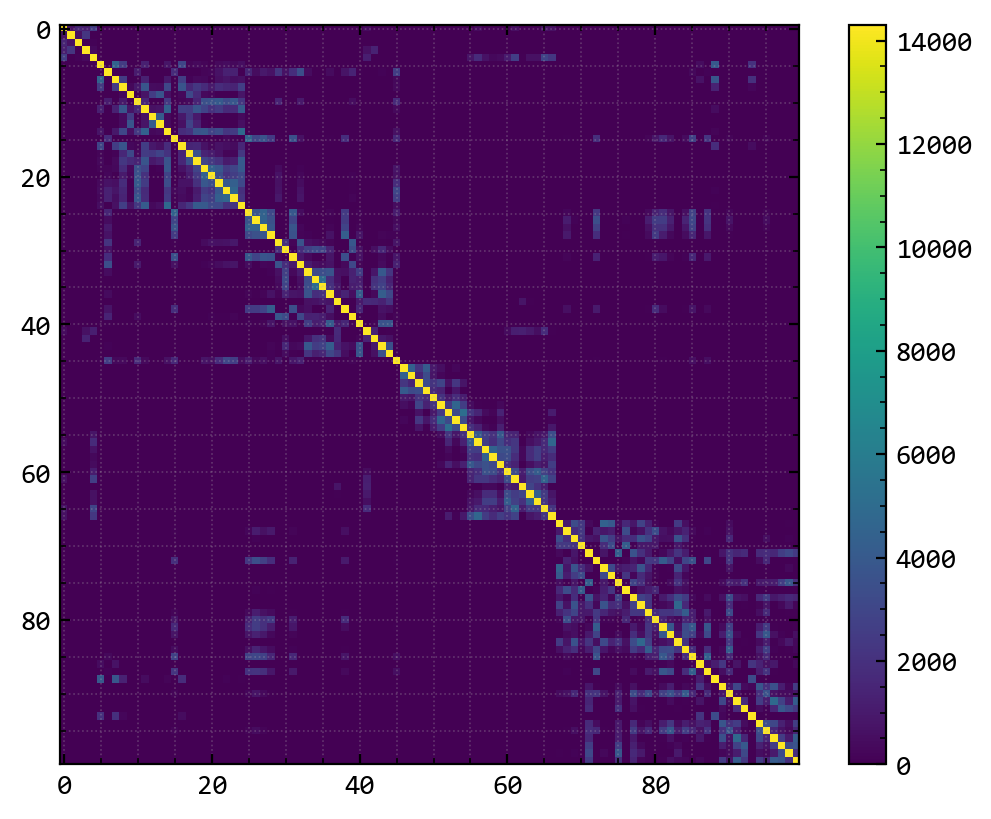

In [240]:
Z_sk = np.empty(x_p.shape[0])
for i in range(x_p.shape[0]):

    dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
    lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)

    print(i,np.sum(lam))

    Z_sk[i] = (lam.T @ (z-m) ) + m # interpolated value

0 0.0
1 0.0
2 0.0
3 0.0
4 0.0
5 0.0
6 0.0
7 0.0
8 0.0
9 0.0
10 0.0
11 0.0
12 0.0
13 0.0
14 0.0
15 26183.9970703125
16 219654.90625
17 253840.125
18 0.0
19 0.0
20 0.0
21 0.0
22 0.0
23 0.0
24 0.0
25 0.0


C:\Users\Florian\AppData\Local\Temp\ipykernel_1520\2915922639.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z_sk[i] = (lam.T @ (z-m) ) + m # interpolated value


26 0.0
27 0.0
28 0.0
29 0.0
30 0.0
31 0.0
32 656.294921875
33 1.185116464668649e+22
34 -2.23681052174828e+22
35 6.567936858076819e+21
36 0.0
37 0.0
38 0.0
39 0.0
40 0.0
41 0.0
42 0.0
43 0.0
44 -1875.7578125
45 0.0
46 0.0
47 0.0
48 0.0
49 0.0
50 2.093822119785639e+22
51 -6.073241868954902e+22
52 2.178602819496907e+23
53 1.9359399572616722e+23
54 0.0
55 0.0
56 0.0
57 0.0
58 0.0
59 0.0
60 0.0
61 7411216.0
62 -537055232.0
63 -715681792.0
64 2687284.0
65 0.0
66 0.0
67 0.0
68 1.34259800922388e+21
69 3.491558302043671e+23
70 -2.8640796219287395e+22
71 6.076553805565559e+22
72 0.0
73 0.0
74 0.0
75 0.0
76 0.0
77 0.0
78 11955863552.0
79 -177249910784.0
80 -78800945152.0
81 -30592434176.0
82 -6636068864.0
83 -806936576.0
84 -45128576.0
85 0.0
86 7.016864493613435e+21
87 -1.4223130420422912e+23
88 2.261740359333701e+23
89 -2.940119224870007e+22
90 0.0
91 0.0
92 0.0
93 -2411769.0
94 3769726.0
95 -4371100.0
96 -224374030336.0
97 856342134784.0
98 -68365183488.0
99 -401928486912.0
100 6.4455288517820

In [241]:
Z_sk = Z_sk.reshape(x_e.shape)

In [242]:
# # SOLVED TODO reshape irgendwas pass noch nicht mit der Orientierung von Z_sk

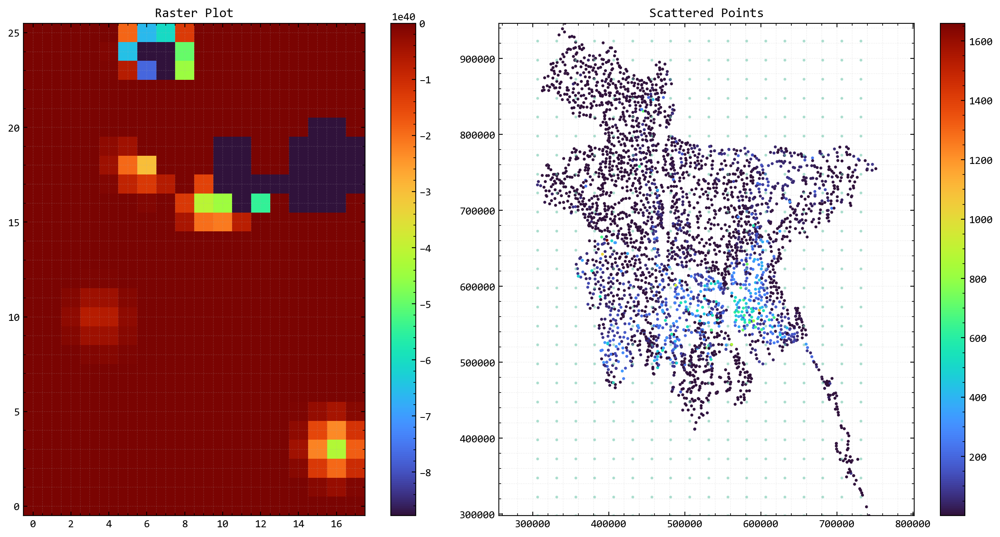

In [243]:
fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 6), vmax=np.nanpercentile(Z_sk, 60))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


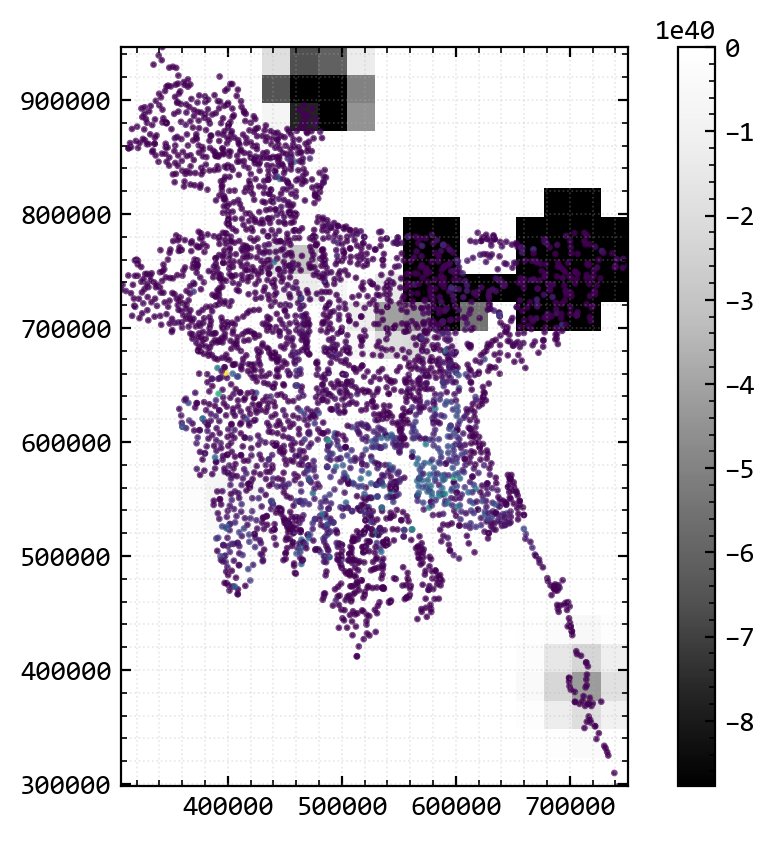

In [244]:
im = plt.imshow(Z_sk,origin="lower",cmap="Greys_r", vmin=np.nanpercentile(Z_sk, 6), vmax=np.nanpercentile(Z_sk,60), extent=[e_range[0], e_range[1], n_range[0], n_range[1]])
plt.scatter(x_o[:,0],x_o[:,1],c=z,s=2,alpha=0.7)
plt.colorbar(im)
plt.show()


#### __2. Indikator Kriging__

A.G. Journel, 1983, "Nonparametric estimation of spatial distributions", https://link.springer.com/article/10.1007/BF01031292